<a href="https://colab.research.google.com/github/SeungJuCha/Ideaton_project/blob/master/Trans_OCR_genFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip uninstall googletrans
!pip install googletrans==4.0.0-rc1 
#바로 설치시 번역기 사용 Error 로 인해 방법 찾아보니, 삭제후 재설치를 요구함

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 KB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 KB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 KB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 KB 7.6 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17414 sha256=1e7bb02d1438de443291ba1720414a24c8c0b1359dd7dc18c020dc39d048d6a3
  Stored in directory: /root/.cache/pip/wheels/a9/25/af/715361fa79594524c89c75d293def652045f3fdce6ca398712
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 4.0.0


In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 KB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.2/619.2 KB 49.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.7.0.72
    Uninstalling opencv-python-headless-4.7.0.72:
      Successfully uninstalled opencv-python-headless-4.7.0.72


In [ ]:
# from matplotlib import pyplot as plt
# from imutils.perspective import four_point_transform
# from imutils.contours import sort_contours
# import imutils
from easyocr import Reader
import cv2
import requests
import numpy as np
from PIL import ImageFont, ImageDraw, Image
import torch

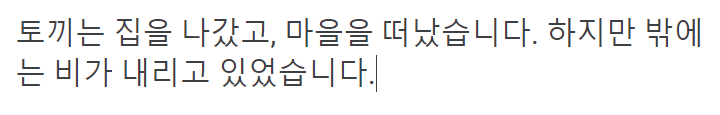

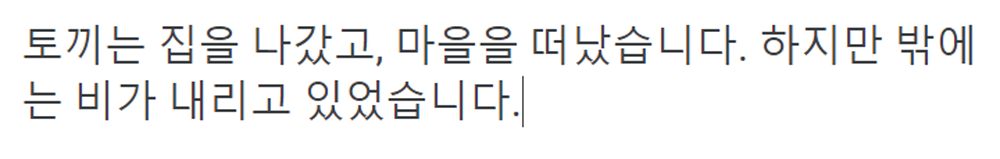

In [ ]:
from google.colab.patches import cv2_imshow
path = '/content/drive/MyDrive'
test = cv2.imread(path+'/rabbit.png', cv2.IMREAD_COLOR)
cv2_imshow(test)

im_resize = cv2.resize(test, dsize= (0,0), fx = 5, fy=5, interpolation = cv2.INTER_CUBIC)
cv2_imshow(im_resize)

cv2.imwrite(path+'/rabbit.jpg', im_resize, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
im_final = cv2.imread(path+'/rabbit.jpg',cv2.IMREAD_COLOR)

#사이즈 확대

활용문구
===

그는 짐을 가지고 정류장에서 택시를 탔다.

In [ ]:
langs = [ 'ko', 'en']
 
print("[INFO] OCR'ing input image...")
reader = Reader(lang_list=langs, gpu=True)
results = reader.readtext(im_final)

[INFO] OCR'ing input image...


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.1% Complete

In [ ]:
print(results)
simple_results = reader.readtext(im_final, detail = 0)

print(len(simple_results))
print(simple_results)

[([[75, 65], [3521, 65], [3521, 269], [75, 269]], '토끼는 집흘 나뭇고 마을을 떠낫습니다. 하지만 밖에', 0.2674928635329924), ([[71, 265], [1911, 265], [1911, 466], [71, 466]], '논 비가 내리고 있없습니다 |', 0.3259037386296108)]
2
['토끼는 집흘 나뭇고 마을을 떠낫습니다. 하지만 밖에', '논 비가 내리고 있없습니다 |']


In [ ]:
join_simple_result = ''.join(simple_results)
print(join_simple_result)
print(type(join_simple_result))
# text = []
# text.append(join_simple_result)

# print(text[0])
# print(len(text))

토끼는 집흘 나뭇고 마을을 떠낫습니다. 하지만 밖에논 비가 내리고 있없습니다 |
<class 'str'>


In [ ]:
!pip install git+https://github.com/ssut/py-hanspell.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/ssut/py-hanspell.git to /tmp/pip-req-build-3uyn7le5
  Running command git clone --filter=blob:none --quiet https://github.com/ssut/py-hanspell.git /tmp/pip-req-build-3uyn7le5
  Resolved https://github.com/ssut/py-hanspell.git to commit 8e993cf46f97f9d665c15633a0fc78ac1b727713
  Preparing metadata (setup.py) ... done
  Created wheel for py-hanspell: filename=py_hanspell-1.1-py3-none-any.whl size=4870 sha256=9cf03789d0b0b4503f0fbf429f2d0d9aafaa27560106ee336c9a95e2237f757e
  Stored in directory: /tmp/pip-ephem-wheel-cache-rkoxcqv1/wheels/3f/a5/73/e4d2806ae141d274fdddaabf8c0ed79be9357d36bfdc99e4b4
Successfully built py-hanspell


In [ ]:
#한글 맞춤법 검사 부분 -> 전반전으로 받침이 없는 경우에 대한 인식률이 높음
#을, 를 같은 조사 부분은 번역할때 인식이 안되도 크게 문제 없는 것으로 확인
from hanspell import spell_checker
handspell= []
spelled_sent = spell_checker.check(join_simple_result)
hanspell_sent = spelled_sent.checked
handspell.append(hanspell_sent)

print(hanspell_sent)
print(len(handspell))

토끼는 집 흘 나무고 마을을 떠났습니다. 하지만 밖에 논 비가 내리고 있없습니다 |
1


In [ ]:
#번역부분
import googletrans

translator = googletrans.Translator(service_urls = ['translate.google.com','translate.google.co.kr'])

for i in range(len(handspell)):
  str1 = handspell[i]

  result1 = translator.translate(str1, src='ko', dest='en')


print(type(result1))

trans_text= result1.text


<class 'googletrans.models.Translated'>


In [ ]:
!pip install diffusers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 KB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 21.2 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate scipy xformers

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 45.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 MB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 94.4 MB/s eta 0:00:00


In [ ]:
!pip uninstall diffusers

Found existing installation: diffusers 0.15.0.dev0
Uninstalling diffusers-0.15.0.dev0:
  Would remove:
    /usr/local/bin/diffusers-cli
    /usr/local/lib/python3.8/dist-packages/diffusers-0.15.0.dev0.dist-info/*
    /usr/local/lib/python3.8/dist-packages/diffusers/*
Proceed (Y/n)? n


Error caught was: No module named 'triton'


/usr/local/lib/python3.8/dist-packages/diffusers/pipelines/pipeline_utils.py:631: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2 via `revision='fp16'`. This behavior is deprecated and will be removed in diffusers v1. One should use `variant='fp16'` instead. However, it appears that stabilityai/stable-diffusion-2 currently does not have the required variant filenames in the 'main' branch. 
 The Diffusers team and community would be very grateful if you could open an issue: https://github.com/huggingface/diffusers/issues/new with the title 'stabilityai/stable-diffusion-2 is missing fp16 files' so that the correct variant file can be added.
  warnings.warn(


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/50 [00:01<?, ?it/s]

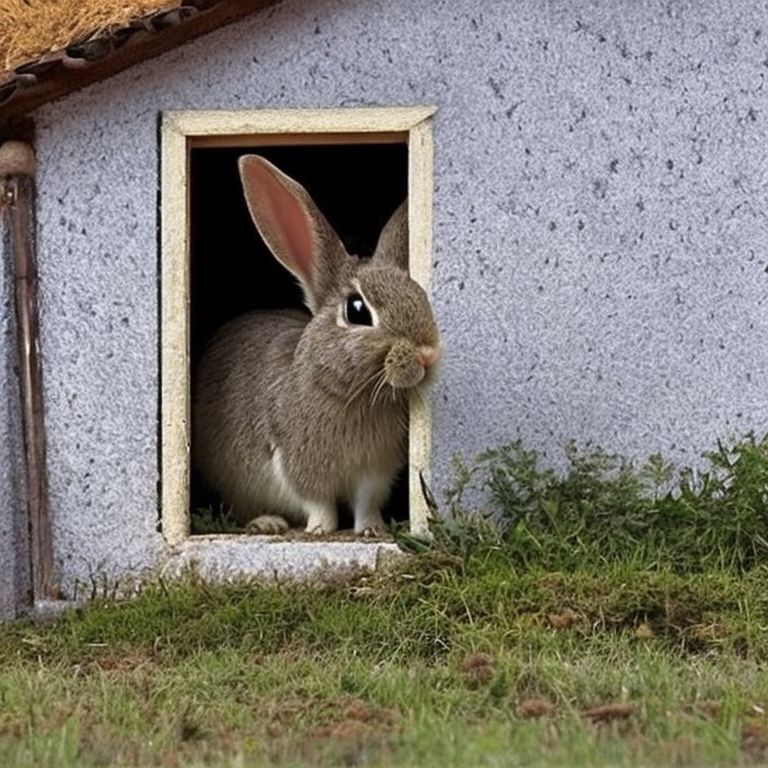

  0%|          | 0/50 [00:00<?, ?it/s]

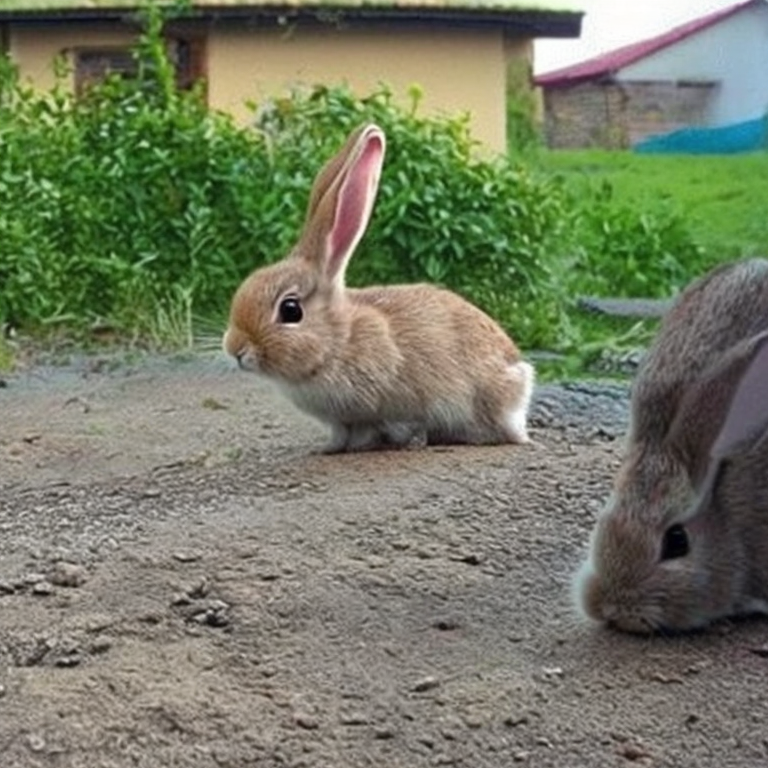

  0%|          | 0/50 [00:00<?, ?it/s]

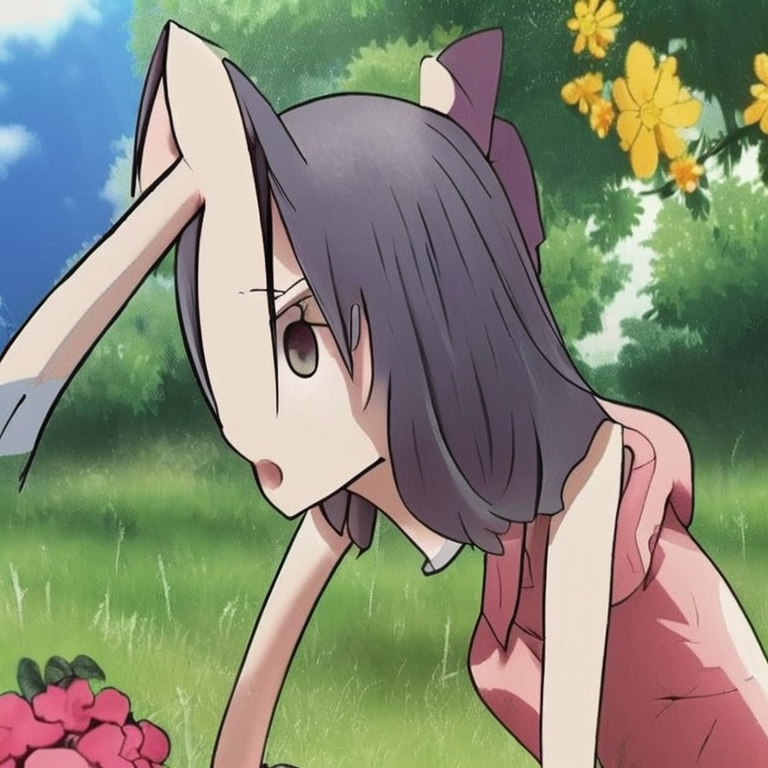

  0%|          | 0/50 [00:00<?, ?it/s]

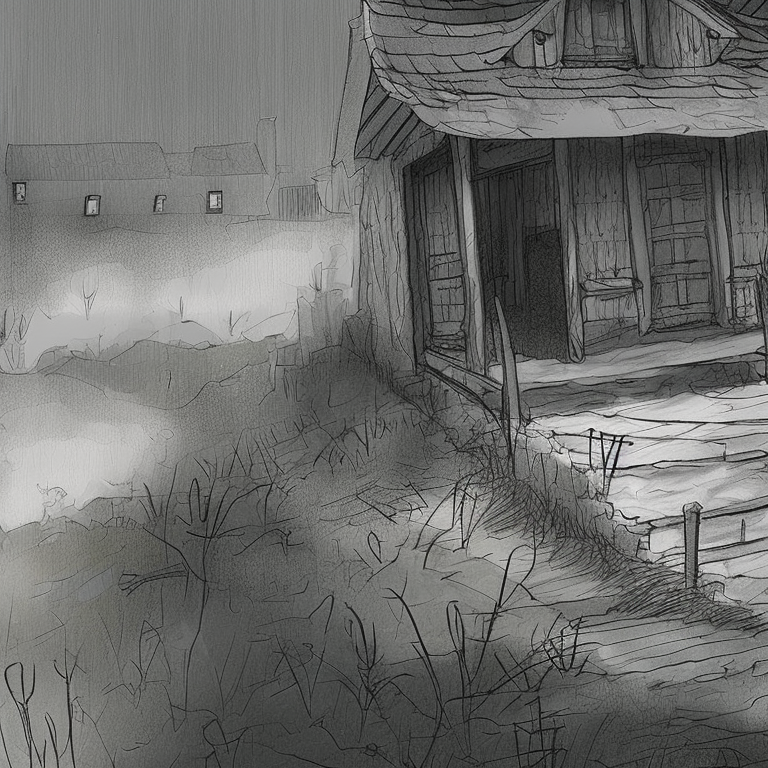

In [ ]:
import torch
from diffusers import StableDiffusionPipeline, EulerDiscreteScheduler

model_id = "stabilityai/stable-diffusion-2"

# Use the Euler scheduler here instead
scheduler = EulerDiscreteScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, revision="fp16", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

# 여러 스타일을 고르는 것도 도움이 됨
style = ['realistic', 'story', 'anime', 'concept art']

for i in style:
  prompt = trans_text + '+' + style[i]
  image = pipe(prompt, height=768, width=768).images[0]
    
  image.show()

종합적이니 내용
===

전반적으로 어느정도 인식률과 그에 따른 번역기 성능은 확인됨

OCR 자체에서 한글 인식률이 낮은편, 특히나 받침이 있는 경우 더욱 정확도가 낮아짐.

이에 따라 번역기 성능에도 한계점이 존재. 단순한 한문장으로 진행하는 것이 효율적일수 있음

다행인점은 번역 중에 조사 부분에서 오류가 있어도 번역도중에는 필요가 없기에 비슷한 맥락의 문맥이 나옴

기존 Notion에 올라간 해리포터 내용으로 실행시 성능적 아쉬움이 존재

해결방법
---
symspell에 한국어 사전을 학습시켜 따로 학습시킨 것을 이용해야 됨
(cost가 매우 높음 )
ko-symspell이 존재하긴 하나 기존의 handspell에 비해 성능적인 아쉬움이 존재.

따라서 단순히 간단한 받침이 없거나 단순한 받침만이 존재하는 문장으로 진행할 필요가 있음. 

*Stalbe diffusion

prompt 생성시 여러가지 스타일을 추가해서 생성할 경우 자신이 원하는 이미지를 얻을수 있을 것으로 판단됨. 실행시 사용한 내용도 동화책 기반으로 생성해 보니 더 어울리는 그림이됨.

여러 스타일이 존재하기에 추가해 보아야 알수 있을듯


In [ ]:
!pip install konlpy


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from konlpy.tag import Okt
from konlpy.tag import Kkma

In [ ]:
okt = Okt()
kkma = Kkma()

text  = '한 마리의 토끼가 집을 나가고 있다. 밖에는 비가 내리고 있다.'

# print(okt.morphs(text))
# print(okt.pos(text))

#Okt 이용한 부분
okt_tag = okt.pos(text)
okt_target_list = list(['Noun', 'Verb'])

#target_list와의 비교를 통해 같을 경우 따로 단어를 추출해내는 방식
okt_keyword = []
for word,pos in okt_tag:
  if pos in okt_target_list:
    okt_keyword.append(word)

print(okt_keyword)



#Kkma 이용 방식은 위와 같음 단지 더 자세히 나눠진 품사들 관련해서는 품사 검색시 나옴

kkma_tag = kkma.pos(text)

kkma_target_list = ['NNG','NNP','NR','NP','VV','VA','VCP','VCN',
               'MDT','MDN','MAG','MAC']

kkma_keyword = []
for word,pos in kkma_tag:
  if pos in kkma_target_list:
    kkma_keyword.append(word)

print(kkma_keyword)



#번역 import는 위에 되어 있음 객체 생성도
keyword_trans_result = []
for word in kkma_keyword:
  result = translator.translate(word, src='ko', dest='en')
  keyword_trans_result.append(result.text)

print(keyword_trans_result)

#prompt 집어넣기 위한 리스트 제거 및 + 첨가

join_trans_result = ','.join(keyword_trans_result)


['한', '마리', '토끼', '집', '나가고', '비', '내리고']
['한', '마리', '토끼', '집', '나가', '밖', '비', '내리']
['one', 'number of animals', 'rabbit', 'house', 'get out', 'Outside', 'rain', 'Downturn']


In [ ]:
join_trans_result = ','.join(keyword_trans_result)
print(join_trans_result)
print(type(join_trans_result))

one,number of animals,rabbit,house,get out,Outside,rain,Downturn
<class 'str'>


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

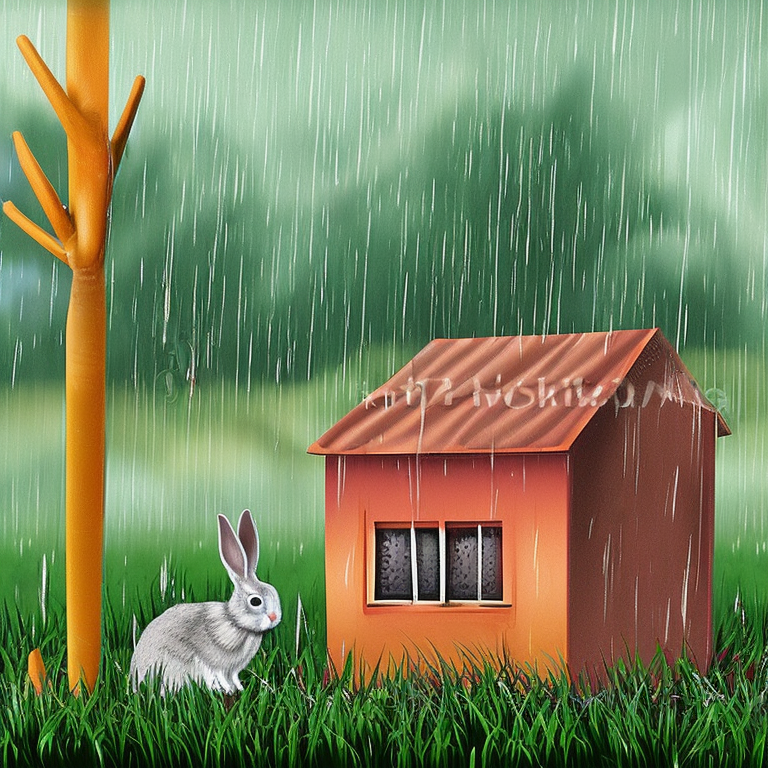

  0%|          | 0/50 [00:00<?, ?it/s]

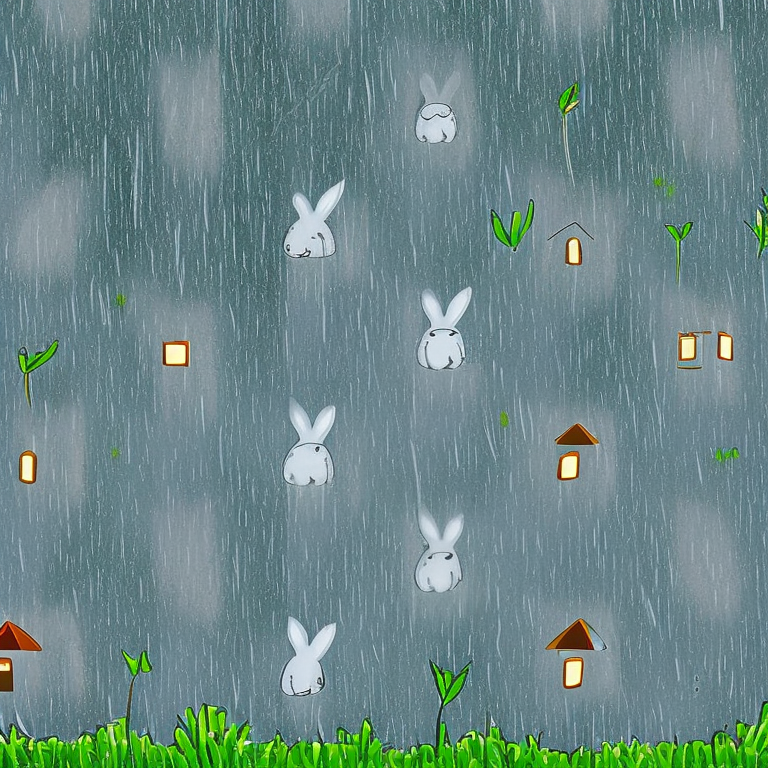

  0%|          | 0/50 [00:00<?, ?it/s]

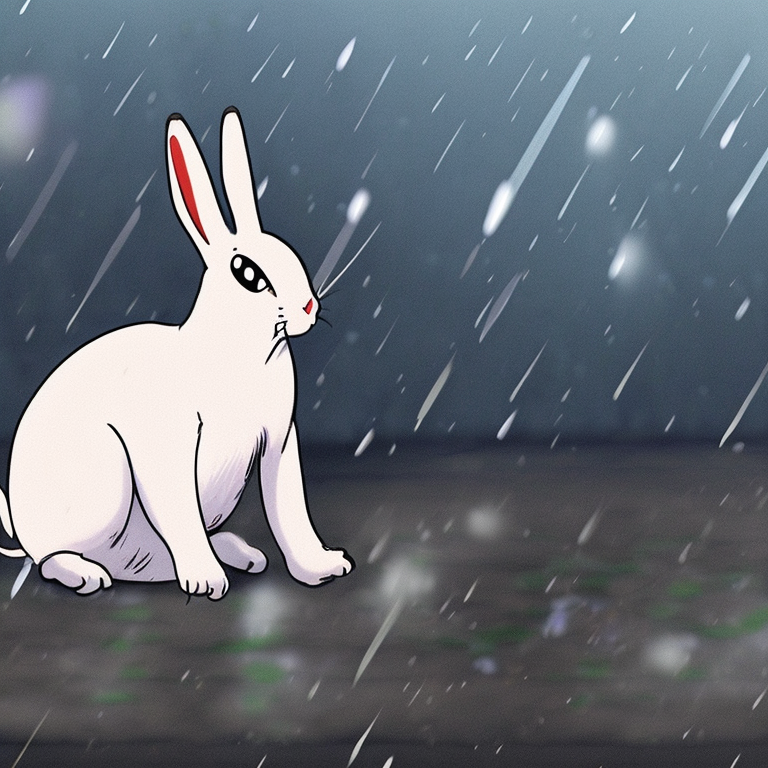

  0%|          | 0/50 [00:00<?, ?it/s]

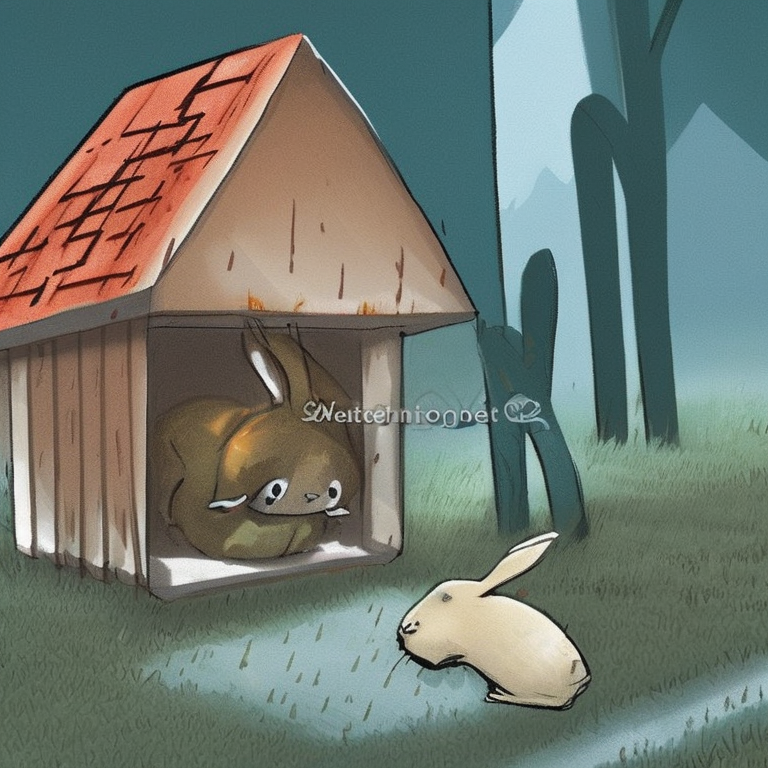

In [ ]:
# Use the Euler scheduler here instead
scheduler = EulerDiscreteScheduler.from_pretrained(model_id, subfolder="scheduler")
pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, revision="fp16", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

# 여러 스타일을 고르는 것도 도움이 됨
style = ['realistic', 'story', 'anime', 'concept art']

for i in style:
  prompt = join_trans_result + '+' + i
  image = pipe(prompt, height=768, width=768).images[0]
    
  image.show()

Okt와 Kkma를 이용해 품사 태깅을 이용해 필요한 prompt생성을 위한 작업

기존 Okt에선 인식하지 못하는 밖 이라는 단어를 인식하기 위해서는 Kkma가 더 적절할 것으로 보임, 

추가적으로 필요한 경우 품사 dic 추가하는 방식으로 더 자세한 keyword추출 가능

http://kkma.snu.ac.kr/documents/?doc=postag

위 사이트 회색 부분의 태그부분이 해당




#전반적인 Flow

1. 기존 텍스트 사용 '토끼가 집을 나가고 밖에 비가 내림'
2. 품사 태깅을 이용해 keyword 추출(주로 명사 형용사 동사 등...)
3. 각 단어별 번역 후 str 변환
4. 기존 stable_diffusion에 input + style

효과

기존에 문장 전체보다는 더 좋은 그림 생성이 된것을 확인(할때마다 다르긴함)
텍스트 인식을 쓰지 않았기에 사용할 필요성이 있음

문제점

 인식 정확도적인 문제로 인해 keyword 추출시 문제 발생 확률이 높을듯

